In [5]:
import torch
from torch.profiler import profile, record_function, ProfilerActivity
path_train = '../data/train_data.pkl'
path_val = '../data/val_data.pkl'

# 2 tensors of size 50000 x 3 x H x W
# denoise model with this data
noisy_imgs_1, noisy_imgs_2 = torch.load(path_train)
noisy_imgs_1 = noisy_imgs_1[0:1000].cpu().float()/256
noisy_imgs_2 = noisy_imgs_2[0:1000].cpu().float()/256

# mean = noisy_imgs_2.mean()
# std = noisy_imgs_2.std()
# noisy_imgs_1 = (noisy_imgs_1 - mean)/std
# noisy_imgs_2 = (noisy_imgs_2 - mean)/std
# # Track the progress with this data
noisy_imgs , clean_imgs = torch.load(path_val)
# print(noisy_imgs_1.size())
# print(noisy_imgs_2.size())
# print(noisy_imgs.size())

# print(clean_imgs.size())
torch.cuda.empty_cache()


In [6]:
noisy_imgs_2.size()

torch.Size([1000, 3, 32, 32])

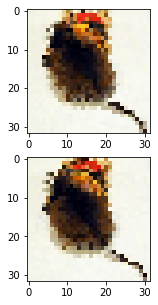

In [7]:
import matplotlib.pyplot as plt
import torchvision.transforms as T 
from PIL import Image

transform = T.ToPILImage()
plt.figure(figsize = [10, 5])
plt.subplot(2,1,1)
plt.imshow(transform((noisy_imgs_1[100])));
plt.subplot(2,1,2)
plt.imshow(transform(noisy_imgs_2[100]));

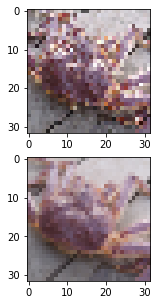

In [8]:
import matplotlib.pyplot as plt
plt.figure(figsize = [10, 5])
plt.subplot(2,1,1)
plt.imshow(transform(noisy_imgs[0]));
plt.subplot(2,1,2)
plt.imshow(transform(clean_imgs[0]));

The goal is to find a model $\phi$:
$$\phi(\hat{X}) = X$$
Quadratic loss: 
$$\hat{w} = argmin \frac{1}{N} \sum_{n=1}^N || x_n - \phi(x_n + \epsilon_n;w) || ^2$$
* $x_n$: data samples
* $\epsilon_n$ : gaussian noise

In [9]:
import torch
import torch.nn as nn


class UNet(nn.Module):
    """Custom U-Net architecture for Noise2Noise (see Appendix, Table 2)."""

    def __init__(self, in_channels=3, out_channels=3, m = 10):
        """Initializes U-Net."""

        super(UNet, self).__init__()
        
#         m = 10

        # Layers: enc_conv0, enc_conv1, pool1
        self._block1 = nn.Sequential(
            nn.Conv2d(in_channels, m, 3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(m, m, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2))

        # Layers: enc_conv(i), pool(i); i=2..5
        self._block2 = nn.Sequential(
            nn.Conv2d(m, m, 3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2))

        # Layers: enc_conv6, upsample5
        self._block3 = nn.Sequential(
            nn.Conv2d(m, m, 3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(m, m, 3, stride=2, padding=1, output_padding=1))
            #nn.Upsample(scale_factor=2, mode='nearest'))

        # Layers: dec_conv5a, dec_conv5b, upsample4
        self._block4 = nn.Sequential(
            nn.Conv2d(m * 2, m * 2, 3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(m*2, m*2, 3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(m*2, m*2, 3, stride=2, padding=1, output_padding=1))
            #nn.Upsample(scale_factor=2, mode='nearest'))

        # Layers: dec_deconv(i)a, dec_deconv(i)b, upsample(i-1); i=4..2
        self._block5 = nn.Sequential(
            nn.Conv2d(m*3, m*2, 3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(m*2, m*2, 3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(m*2, m*2, 3, stride=2, padding=1, output_padding=1))
            #nn.Upsample(scale_factor=2, mode='nearest'))

        # Layers: dec_conv1a, dec_conv1b, dec_conv1c,
        self._block6 = nn.Sequential(
            nn.Conv2d(m*2 + in_channels, 64, 3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 32, 3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, out_channels, 3, stride=1, padding=1),
            nn.LeakyReLU(0.1))

        # Initialize weights
        self._init_weights()


    def _init_weights(self):
        """Initializes weights using He et al. (2015)."""

        for m in self.modules():
            if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight.data)
                m.bias.data.zero_()


    def forward(self, x):
        """Through encoder, then decoder by adding U-skip connections. """

        # Encoder
        pool1 = self._block1(x)
        pool2 = self._block2(pool1)
        pool3 = self._block2(pool2)
        pool4 = self._block2(pool3)
        pool5 = self._block2(pool4)

        # Decoder
        upsample5 = self._block3(pool5)
        concat5 = torch.cat((upsample5, pool4), dim=1)
        upsample4 = self._block4(concat5)
        concat4 = torch.cat((upsample4, pool3), dim=1)
        upsample3 = self._block5(concat4)
        concat3 = torch.cat((upsample3, pool2), dim=1)
        upsample2 = self._block5(concat3)
        concat2 = torch.cat((upsample2, pool1), dim=1)
        upsample1 = self._block5(concat2)
        concat1 = torch.cat((upsample1, x), dim=1)

        # Final activation
        return self._block6(concat1)




In [16]:
from torch import nn
from tqdm import tqdm
# device = 'cpu'


from PIL import Image
import torch 
import torchvision 
import torchvision.transforms as T 
from PIL import Image

transform = T.ToPILImage()
model = UNet(m=10).to(device)


optimizer = torch.optim.Adam(model.parameters(), lr = 1e-4)
mse = nn.MSELoss()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
batch_size, nb_epochs = 50, 100

input = noisy_imgs_1.to(device).type(torch.float).split(batch_size)
target = noisy_imgs_2.to(device).type(torch.float).split(batch_size)

valid_inp = noisy_imgs.to(device).float()/256
valid_target = clean_imgs.to(device).float()/256

  0%|          | 0/100 [00:00<?, ?it/s]

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.])


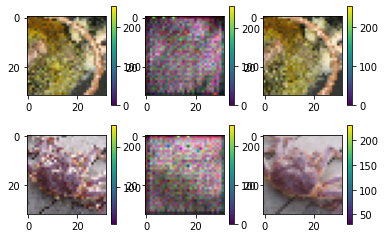

  1%|          | 1/100 [00:00<01:25,  1.16it/s]

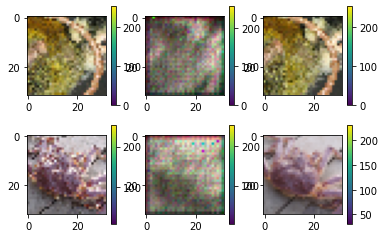

  2%|▏         | 2/100 [00:01<01:23,  1.17it/s]

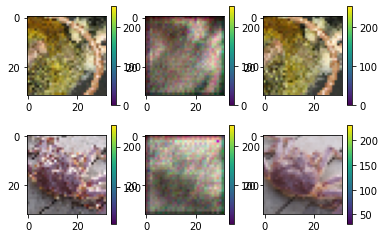

  3%|▎         | 3/100 [00:02<01:26,  1.13it/s]

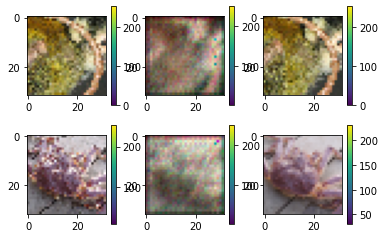

  4%|▍         | 4/100 [00:03<01:23,  1.15it/s]

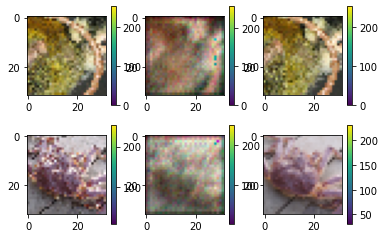

  5%|▌         | 5/100 [00:04<01:24,  1.12it/s]

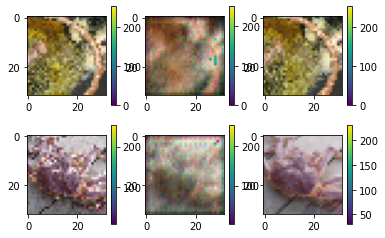

  6%|▌         | 6/100 [00:05<01:22,  1.14it/s]

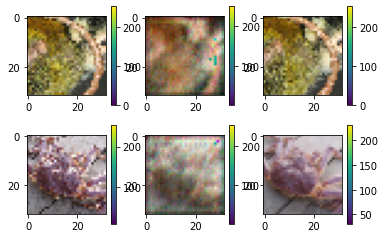

  7%|▋         | 7/100 [00:06<01:20,  1.15it/s]

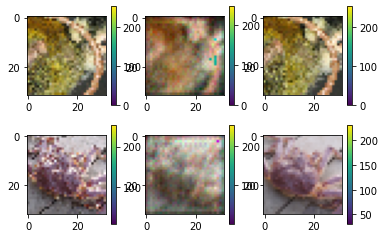

  8%|▊         | 8/100 [00:07<01:21,  1.12it/s]

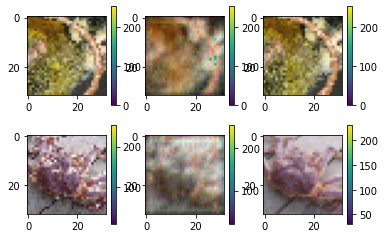

  9%|▉         | 9/100 [00:07<01:19,  1.14it/s]

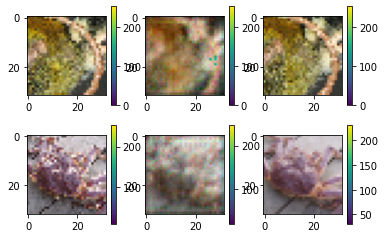

 10%|█         | 10/100 [00:08<01:17,  1.15it/s]

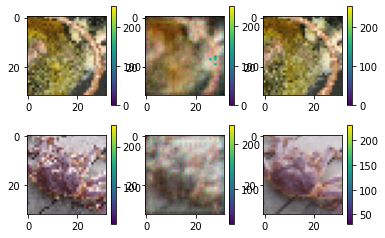

 11%|█         | 11/100 [00:09<01:18,  1.13it/s]

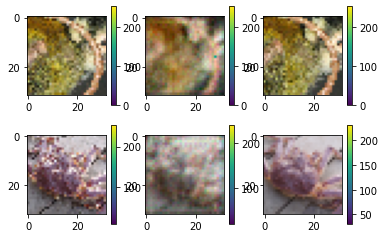

 12%|█▏        | 12/100 [00:10<01:16,  1.15it/s]

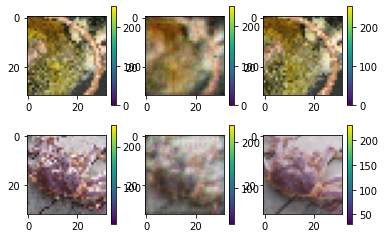

 13%|█▎        | 13/100 [00:11<01:15,  1.16it/s]

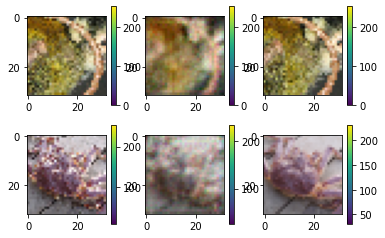

 14%|█▍        | 14/100 [00:12<01:16,  1.13it/s]

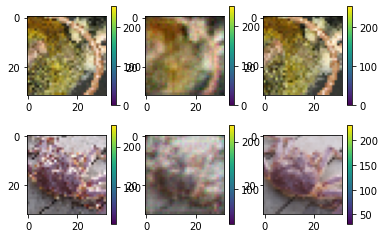

 15%|█▌        | 15/100 [00:13<01:14,  1.15it/s]

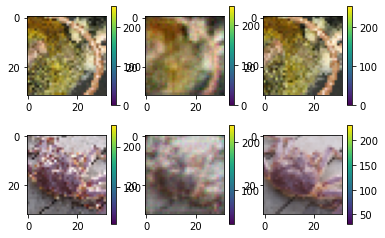

 16%|█▌        | 16/100 [00:14<01:14,  1.13it/s]

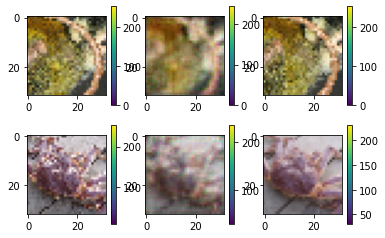

 17%|█▋        | 17/100 [00:14<01:12,  1.15it/s]

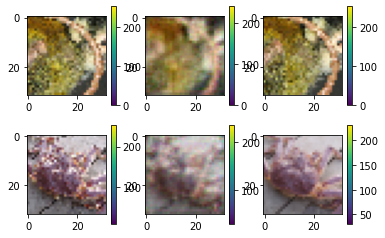

 18%|█▊        | 18/100 [00:15<01:11,  1.15it/s]

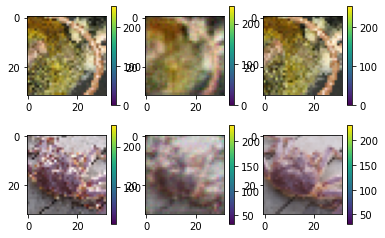

 19%|█▉        | 19/100 [00:16<01:12,  1.12it/s]

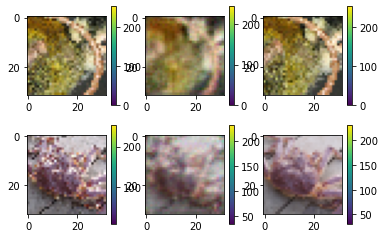

 20%|██        | 20/100 [00:17<01:10,  1.14it/s]

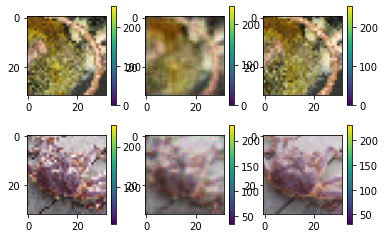

 21%|██        | 21/100 [00:18<01:08,  1.15it/s]

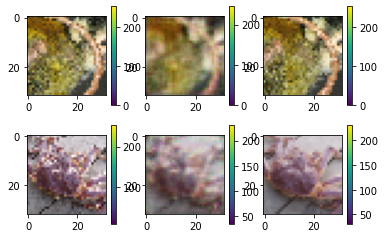

 22%|██▏       | 22/100 [00:19<01:09,  1.12it/s]

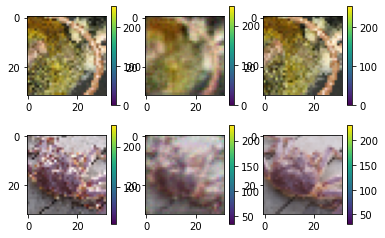

 23%|██▎       | 23/100 [00:20<01:07,  1.14it/s]

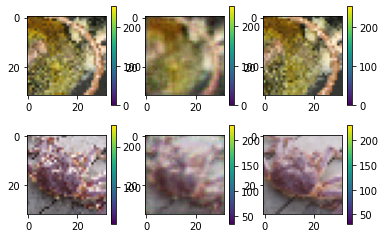

 24%|██▍       | 24/100 [00:21<01:05,  1.15it/s]

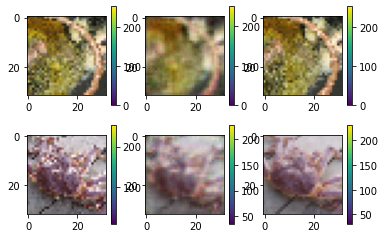

 25%|██▌       | 25/100 [00:21<01:06,  1.13it/s]

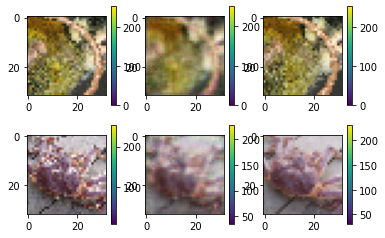

 26%|██▌       | 26/100 [00:22<01:04,  1.14it/s]

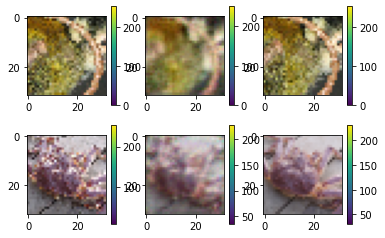

 27%|██▋       | 27/100 [00:23<01:05,  1.12it/s]

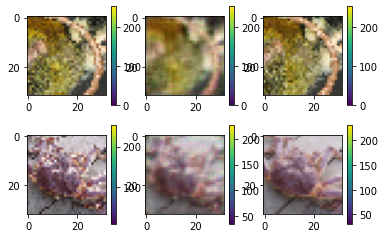

 28%|██▊       | 28/100 [00:24<01:03,  1.14it/s]

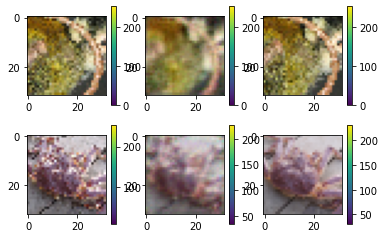

 29%|██▉       | 29/100 [00:25<01:01,  1.15it/s]

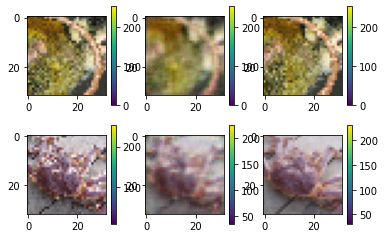

 30%|███       | 30/100 [00:26<01:02,  1.12it/s]

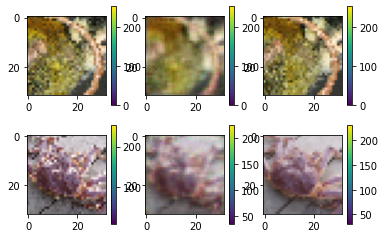

 31%|███       | 31/100 [00:27<01:00,  1.13it/s]

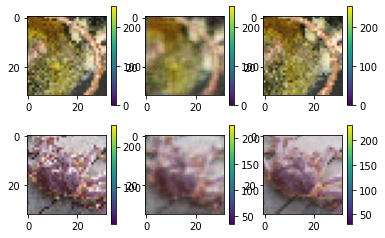

 32%|███▏      | 32/100 [00:28<00:59,  1.15it/s]

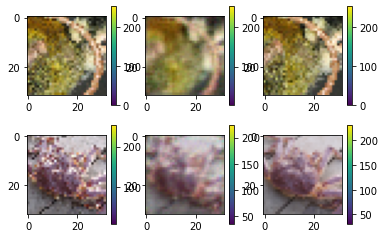

 33%|███▎      | 33/100 [00:29<00:59,  1.12it/s]

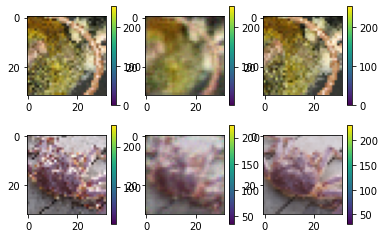

 34%|███▍      | 34/100 [00:29<00:57,  1.14it/s]

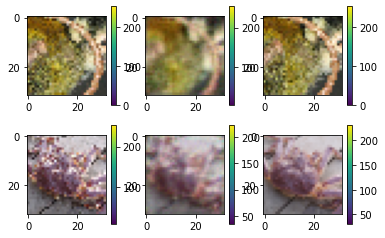

 35%|███▌      | 35/100 [00:30<00:56,  1.16it/s]

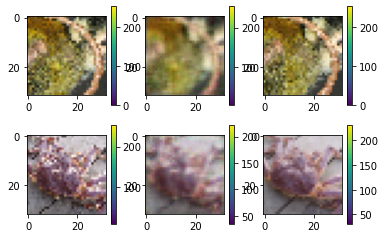

 36%|███▌      | 36/100 [00:31<00:56,  1.13it/s]

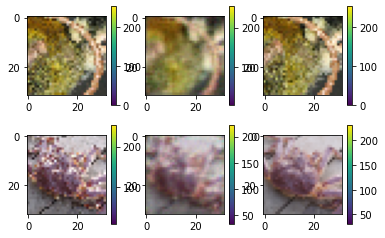

 37%|███▋      | 37/100 [00:32<00:55,  1.14it/s]

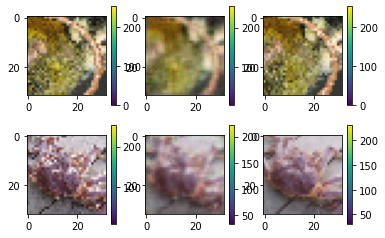

 38%|███▊      | 38/100 [00:33<00:55,  1.12it/s]

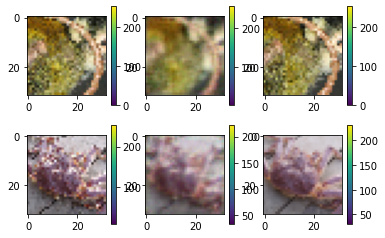

 39%|███▉      | 39/100 [00:34<00:53,  1.14it/s]

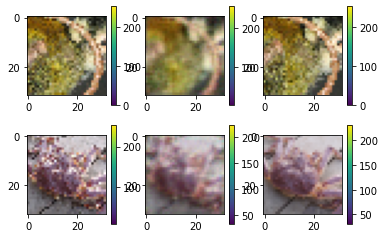

 40%|████      | 40/100 [00:35<00:52,  1.15it/s]

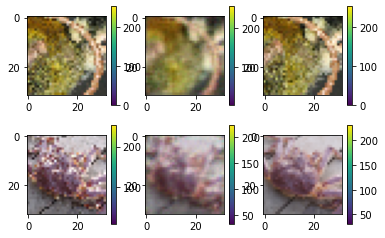

 41%|████      | 41/100 [00:36<00:52,  1.12it/s]

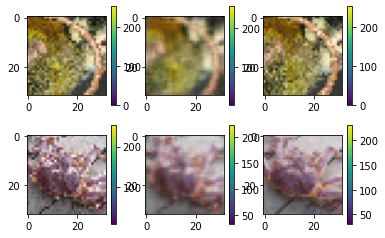

 42%|████▏     | 42/100 [00:36<00:50,  1.14it/s]

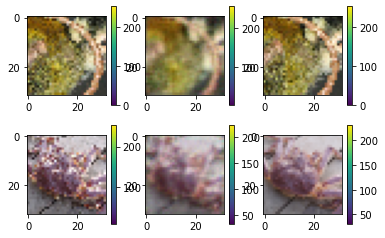

 43%|████▎     | 43/100 [00:37<00:49,  1.15it/s]

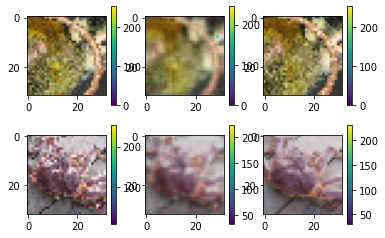

 44%|████▍     | 44/100 [00:38<00:49,  1.12it/s]

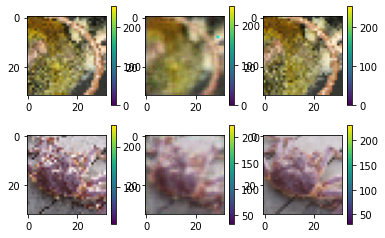

 45%|████▌     | 45/100 [00:39<00:48,  1.14it/s]

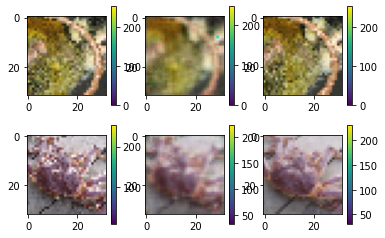

 46%|████▌     | 46/100 [00:40<00:46,  1.15it/s]

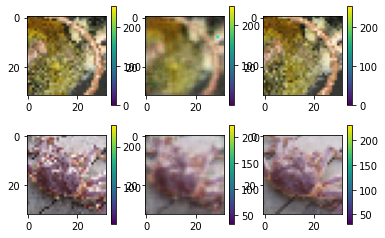

 47%|████▋     | 47/100 [00:41<00:46,  1.13it/s]

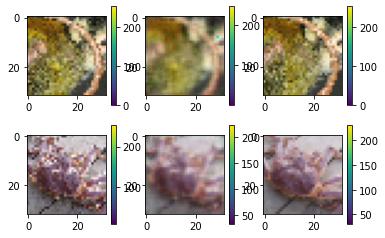

 48%|████▊     | 48/100 [00:42<00:45,  1.15it/s]

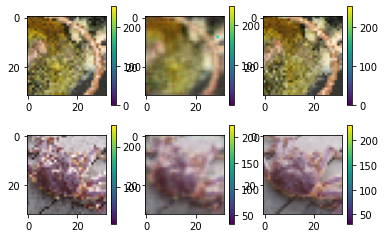

 49%|████▉     | 49/100 [00:43<00:45,  1.13it/s]

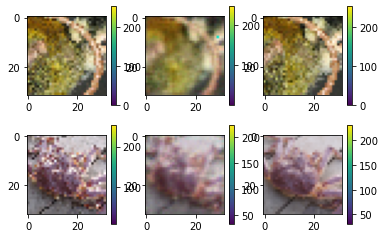

 50%|█████     | 50/100 [00:43<00:43,  1.14it/s]

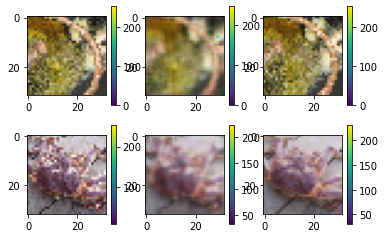

 51%|█████     | 51/100 [00:44<00:42,  1.15it/s]

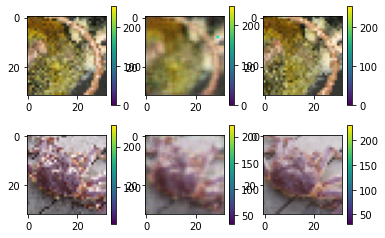

 52%|█████▏    | 52/100 [00:45<00:42,  1.12it/s]

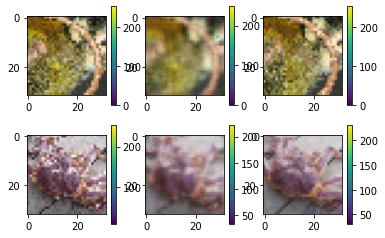

 53%|█████▎    | 53/100 [00:46<00:41,  1.14it/s]

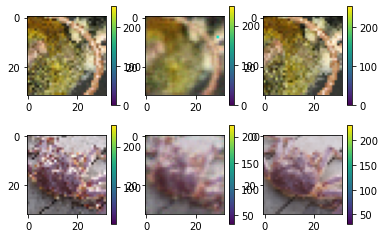

 54%|█████▍    | 54/100 [00:47<00:39,  1.15it/s]

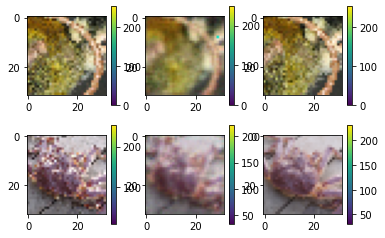

 55%|█████▌    | 55/100 [00:48<00:40,  1.12it/s]

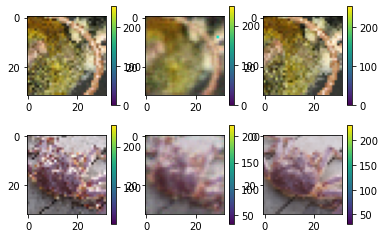

 56%|█████▌    | 56/100 [00:49<00:38,  1.14it/s]

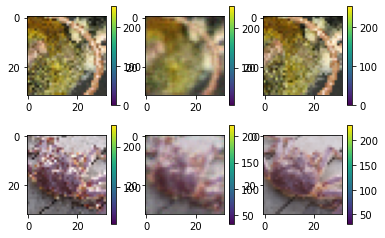

 57%|█████▋    | 57/100 [00:50<00:37,  1.15it/s]

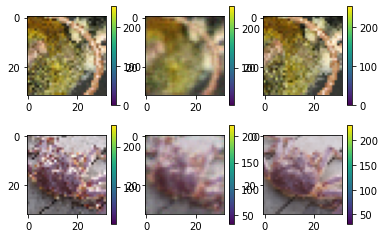

 58%|█████▊    | 58/100 [00:50<00:37,  1.13it/s]

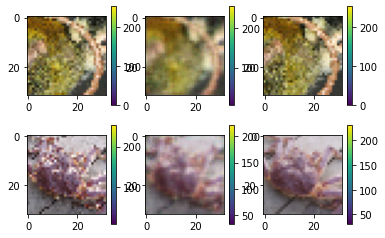

 59%|█████▉    | 59/100 [00:51<00:35,  1.14it/s]

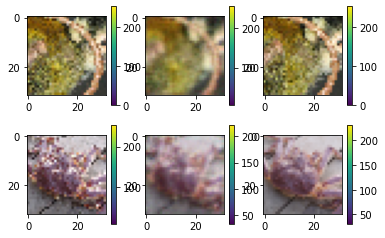

 60%|██████    | 60/100 [00:52<00:35,  1.13it/s]

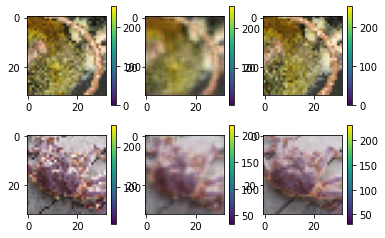

 61%|██████    | 61/100 [00:53<00:34,  1.14it/s]

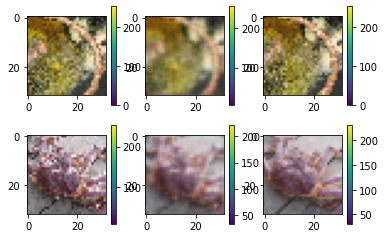

 62%|██████▏   | 62/100 [00:54<00:32,  1.15it/s]

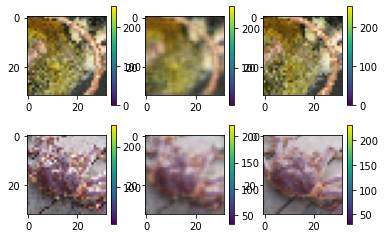

 63%|██████▎   | 63/100 [00:55<00:32,  1.13it/s]

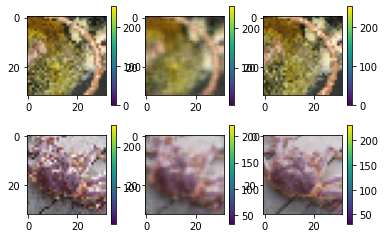

 64%|██████▍   | 64/100 [00:56<00:31,  1.14it/s]

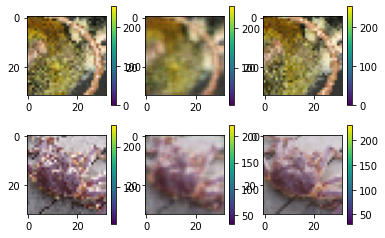

 65%|██████▌   | 65/100 [00:57<00:30,  1.15it/s]

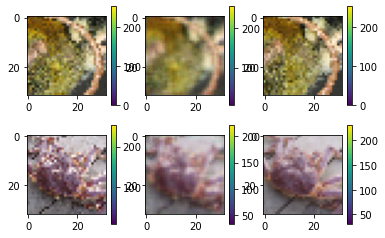

 66%|██████▌   | 66/100 [00:57<00:30,  1.13it/s]

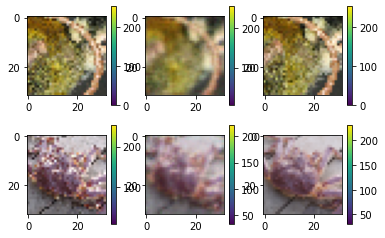

 67%|██████▋   | 67/100 [00:58<00:28,  1.14it/s]

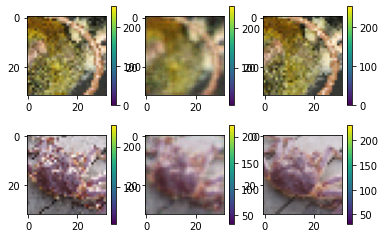

 68%|██████▊   | 68/100 [00:59<00:27,  1.15it/s]

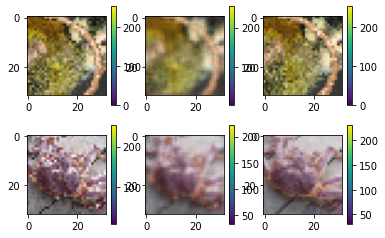

 69%|██████▉   | 69/100 [01:00<00:27,  1.13it/s]

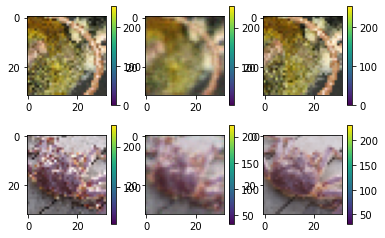

 70%|███████   | 70/100 [01:01<00:26,  1.14it/s]

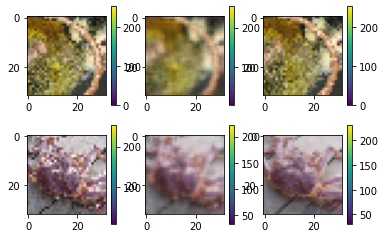

 71%|███████   | 71/100 [01:02<00:25,  1.12it/s]

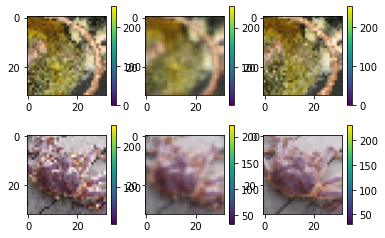

 72%|███████▏  | 72/100 [01:03<00:24,  1.14it/s]

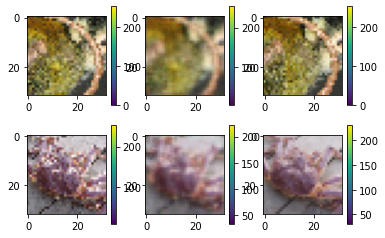

 73%|███████▎  | 73/100 [01:04<00:23,  1.15it/s]

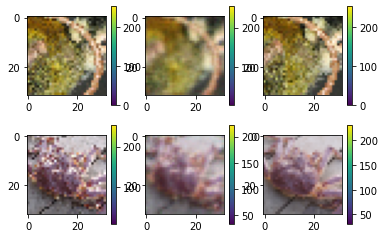

 74%|███████▍  | 74/100 [01:05<00:23,  1.12it/s]

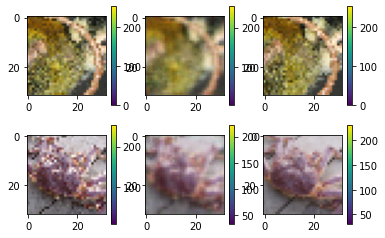

 75%|███████▌  | 75/100 [01:05<00:22,  1.13it/s]

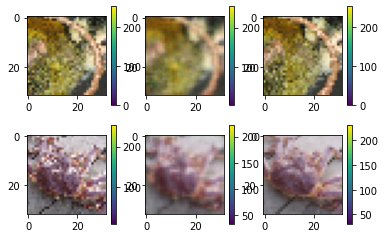

 76%|███████▌  | 76/100 [01:06<00:20,  1.14it/s]

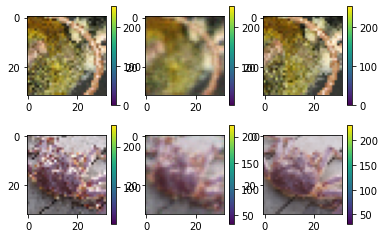

 77%|███████▋  | 77/100 [01:07<00:20,  1.12it/s]

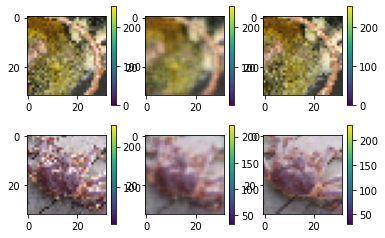

 78%|███████▊  | 78/100 [01:08<00:19,  1.14it/s]

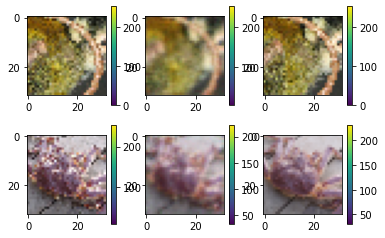

 79%|███████▉  | 79/100 [01:09<00:18,  1.15it/s]

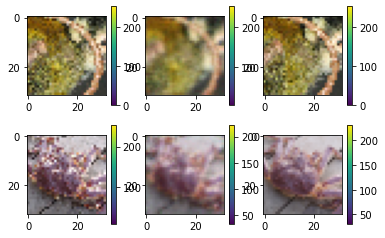

 80%|████████  | 80/100 [01:10<00:17,  1.12it/s]

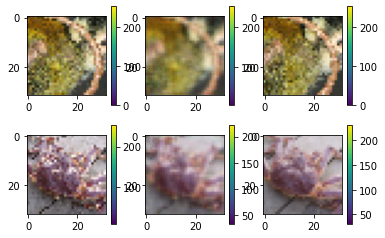

 81%|████████  | 81/100 [01:11<00:16,  1.14it/s]

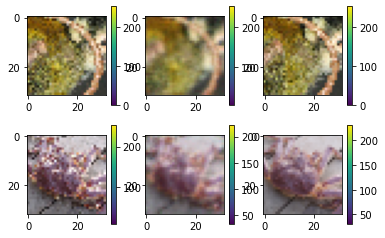

 82%|████████▏ | 82/100 [01:12<00:16,  1.12it/s]

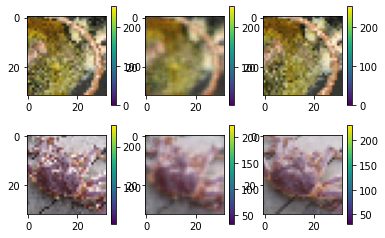

 83%|████████▎ | 83/100 [01:12<00:14,  1.14it/s]

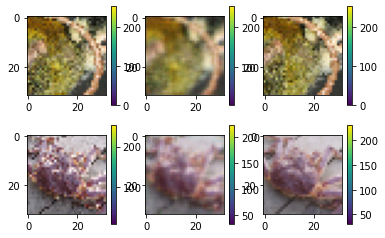

 84%|████████▍ | 84/100 [01:13<00:13,  1.15it/s]

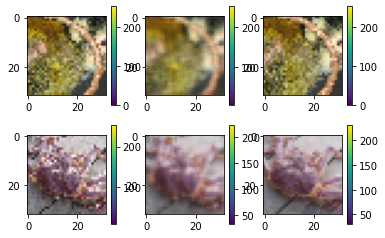

 85%|████████▌ | 85/100 [01:14<00:13,  1.12it/s]

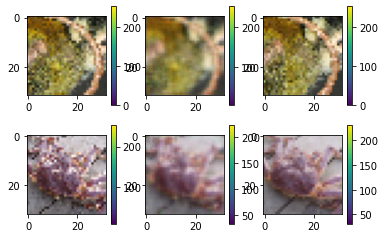

 86%|████████▌ | 86/100 [01:15<00:12,  1.14it/s]

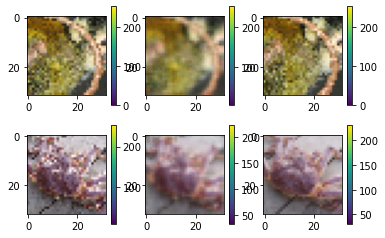

 87%|████████▋ | 87/100 [01:16<00:11,  1.14it/s]

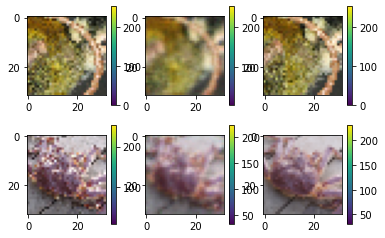

 88%|████████▊ | 88/100 [01:17<00:10,  1.12it/s]

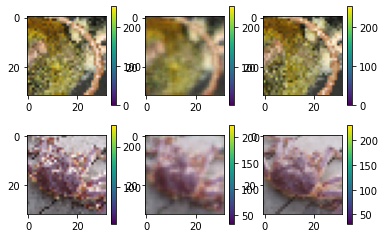

 89%|████████▉ | 89/100 [01:18<00:09,  1.14it/s]

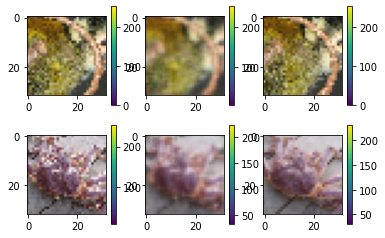

 90%|█████████ | 90/100 [01:19<00:08,  1.15it/s]

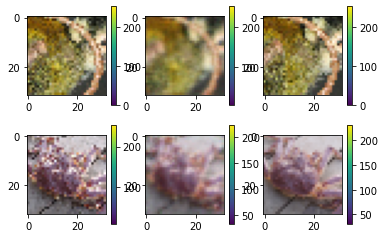

 91%|█████████ | 91/100 [01:20<00:08,  1.12it/s]

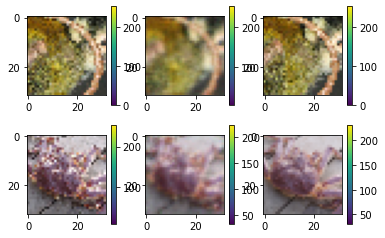

 92%|█████████▏| 92/100 [01:20<00:07,  1.14it/s]

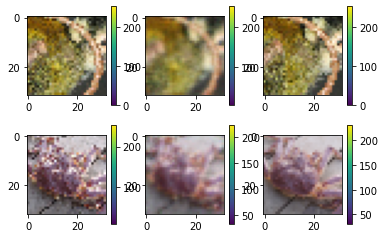

 93%|█████████▎| 93/100 [01:21<00:06,  1.12it/s]

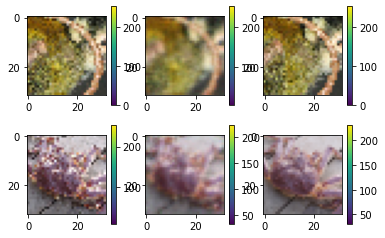

 94%|█████████▍| 94/100 [01:22<00:05,  1.13it/s]

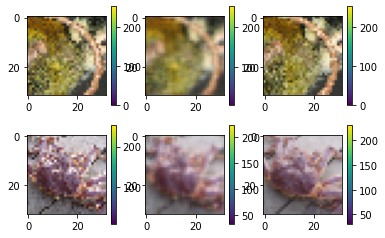

 95%|█████████▌| 95/100 [01:23<00:04,  1.15it/s]

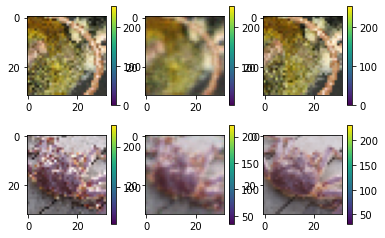

 96%|█████████▌| 96/100 [01:24<00:03,  1.12it/s]

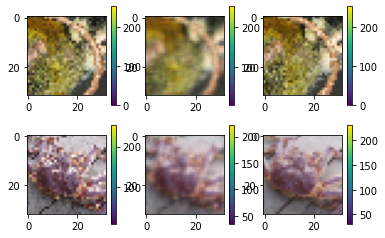

 97%|█████████▋| 97/100 [01:25<00:02,  1.14it/s]

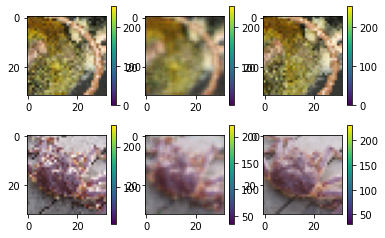

 98%|█████████▊| 98/100 [01:26<00:01,  1.15it/s]

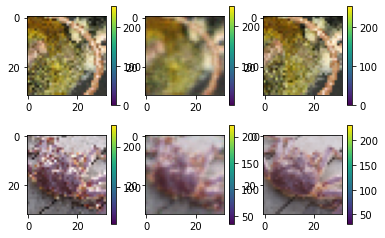

 99%|█████████▉| 99/100 [01:27<00:00,  1.12it/s]

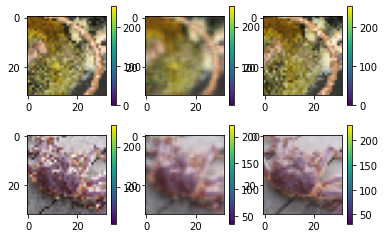

100%|██████████| 100/100 [01:27<00:00,  1.14it/s]


In [17]:




loss_tot = torch.zeros(nb_epochs)
loss_valid = torch.zeros(nb_epochs)
print(loss_tot)
for e in tqdm(range(nb_epochs)):
    model.train()
    for i in range(len(input)):
        output = model(input[i])
        loss = mse(output, target[i])
        loss_tot[e] += loss.item()    

        
        optimizer.zero_grad()
        loss.backward( retain_graph=True)
        optimizer.step()
    
    model.eval()
    valid_output = model(valid_inp)
    loss_valid[e] = mse(valid_output, valid_target).item()

    if torch.remainder(torch.tensor(e), 10)==0:
        plt.figure()
        im = 0
        im2 = 0
        plt.subplot(2, 3, 1)
        plt.imshow(transform(input[i][im]))
        plt.colorbar()
        plt.subplot(2, 3, 2)
        plt.imshow(transform(output[im]))
        plt.colorbar()
        plt.subplot(2, 3, 3)
        plt.imshow(transform(target[i][im]))
        plt.colorbar()
        plt.subplot(2, 3, 4)
        plt.imshow(transform(valid_inp[im2]))
        plt.colorbar()
        plt.subplot(2, 3, 5)
        plt.imshow(transform(valid_output[im2]))
        plt.colorbar()
        plt.subplot(2, 3, 6)
        plt.imshow(transform(valid_target[im2]))
        plt.colorbar()
        plt.show()


# print(output[0].size(), target[0].size())
    

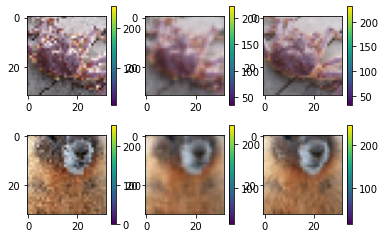

In [21]:
plt.figure()
im = 0
im2 = 1
plt.subplot(2, 3, 1)
plt.imshow(transform(valid_inp[im]))
plt.colorbar()
plt.subplot(2, 3, 2)
plt.imshow(transform(valid_output[im]))
plt.colorbar()
plt.subplot(2, 3, 3)
plt.imshow(transform(valid_target[im]))
plt.colorbar()
plt.subplot(2, 3, 4)
plt.imshow(transform(valid_inp[im2]))
plt.colorbar()
plt.subplot(2, 3, 5)
plt.imshow(transform(valid_output[im2]))
plt.colorbar()
plt.subplot(2, 3, 6)
plt.imshow(transform(valid_target[im2]))
plt.colorbar()
plt.show()

torch.Size([3, 32, 32]) torch.Size([50, 3, 32, 32])


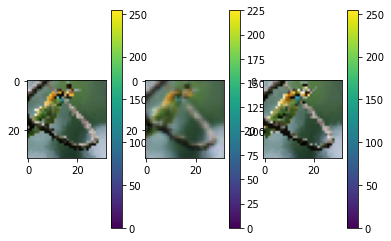

In [19]:
  
plt.figure()
im = 10
plt.subplot(1, 3, 1)
plt.imshow(transform(input[i][im]))
plt.colorbar()
plt.subplot(1, 3, 2)
plt.imshow(transform(output[im]))
plt.colorbar()

plt.subplot(1, 3, 3)
plt.imshow(transform(target[i][im]))
plt.colorbar()


print(output[0].size(), target[0].size())


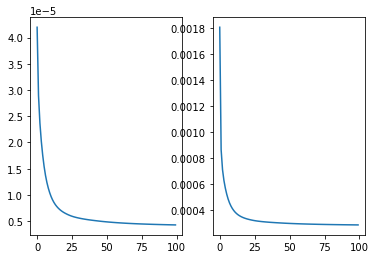

In [20]:
plt.figure()
plt.subplot(1, 2, 1)
plt.plot(loss_valid/1000)
plt.subplot(1, 2, 2)

plt.plot(loss_tot/1000)

In [ ]:
mse = nn.MSELoss()

inp = input[i][0]
t = target[i][0]
out = output[0]
plt.imshow((inp - t).detach().cpu()[0]**2)
plt.colorbar()
plt.figure()
plt.imshow(transform(inp))

In [ ]:
plt.plot(loss_tot)
plt.plot(sum(mse(input[i], target[i]).item() for i in range(10))*torch.ones(len(loss_tot)))

In [ ]:
mse(input[i], target[i])

In [ ]:
plt.plot(loss_tot_with_dropout)
plt.plot(sum(mse(input[i], target[i]).item() for i in range(len(input)))*torch.ones(len(loss_tot_with_dropout)))

In [ ]:
plt.plot(loss_tot_with_batchnorm)

In [ ]:
plt.plot(loss_tot_with_batchnorm)

In [ ]:
plt.plot(loss_tot_with_batchnorm)

In [ ]:
plt.plot(loss_tot_with_batchnorm)

In [ ]:
plt.plot(loss_tot_with_batchnorm)

In [ ]:
plt.plot(loss_tot_with_batchnorm)